In [ ]:
from google.colab import drive
from google.colab.patches import *
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install ultralytics
!pip install easyocr

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 19.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 908.3/908.3 kB 34.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 307.2/307.2 kB 25.2 MB/s eta 0:00:00


In [ ]:
from ultralytics import YOLO
import cv2, os, glob
import numpy as np, pandas as pd
import matplotlib.pyplot as plt

import easyocr

In [ ]:
cocomodel=YOLO('yolov8n.pt')
lpd=YOLO('/content/drive/MyDrive/model_weights/license_plate_detector.pt')
# print(cocomodel)

In [ ]:
vehicle=[2,3,4,6,8]         #list of label id for vechil detection
resultes={}

In [ ]:
video="/content/drive/MyDrive/google_colab_datasets/input_videos/ANPR (number plate)/4K Road traffic video.mp4"
image="/content/drive/MyDrive/google_colab_datasets/input_image/ANPR/79094948-25d3-418e-86fc-3c2d62917f62___513039-volkswagen-vento-test-drive-review-06032011612.jpg.jpeg"

In [ ]:
# # for geting frames
# vid=cv2.VideoCapture(video)
# ret,frame_nmr=True,-1
# frames=[]

# while(ret):
#     frame_nmr+=1
#     ret,frame=vid.read()
#     print(ret,frame_nmr)
#     if(ret):
#         if(frame_nmr>0): break
#         resultes[frame_nmr]={}

#         # detect vechile
#         detections= cocomodel(frame)[0]
#         detections_list=[]
#         # print(detections)
#         # detectic  vechile
#         for detection in detections.boxes.data.tolist():
#             x1,y1,x2,y2,score,class_id=detection
#             if(int(class_id) in vehicle):
#                 detections_list.append([x1,y1,x2,y2,score])

#         # print(detections_list)

#         for data in detections_list:
#           x1,y1,x2,y2,score=data
#           frame=cv2.rectangle(frame,(int(x1),int(y1)),(int(x2),int(y2)),(0,255,0),2)
#           print(data)
#     frames.append(frame)




0: 384x640 4 persons, 6 cars, 1 bus, 1 umbrella, 10.2ms
Speed: 2.7ms preprocess, 10.2ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)


True 0
[844.5333251953125, 238.99195861816406, 974.28369140625, 354.4096984863281, 0.7505859732627869]
[1210.003662109375, 440.1046142578125, 1353.970947265625, 605.7837524414062, 0.7363072633743286]
[1071.5408935546875, 232.88442993164062, 1187.5037841796875, 329.7734069824219, 0.6343747973442078]
[681.563232421875, 827.848388671875, 958.6373291015625, 1094.1771240234375, 0.6135841012001038]
[1668.676025390625, 1461.06689453125, 1858.253173828125, 1562.635009765625, 0.3391561508178711]
[331.54364013671875, 2019.21533203125, 750.9495239257812, 2157.57275390625, 0.2746177315711975]
True 1



0: 480x640 2 License_Plates, 23.1ms
Speed: 3.8ms preprocess, 23.1ms inference, 1.9ms postprocess per image at shape (1, 3, 480, 640)


1215.5164794921875 951.3465576171875 2147.708251953125 1313.576904296875 0.5621168613433838 0.0


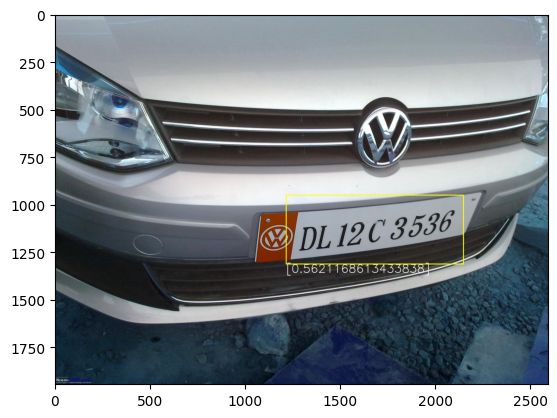

In [ ]:
img=cv2.imread(image)
detection=lpd(img)[0]
# print(detection)
temp=detection.boxes.data.tolist()
# print(temp)
x1,y1,x2,y2,score,class_id=temp[0]
print(x1,y1,x2,y2,score,class_id)
x1,y1,x2,y2=map(int,(x1,y1,x2,y2))
# temp_img=img[int(y1):int(y2),int(x1):int(x2),:]
img=cv2.putText(img,text=(f"[{score}]"),org=(x1,y2+45),fontFace=cv2.FONT_HERSHEY_SIMPLEX,fontScale=2,color=(255,255,255),thickness=2,lineType=cv2.LINE_AA)
img=cv2.rectangle(img,(x1,y1),(x2,y2),(255,255,0),4)
cv2.imwrite("/content/drive/MyDrive/google_colab_datasets/output/ANPR/images/vicheldetection/lices_1.png",img)
plt.imshow(img)

In [ ]:
img=cv2.imread(image)
cv2.imwrite("/content/drive/MyDrive/google_colab_datasets/output/ANPR/images/vicheldetection/lices_0.png",img)


True

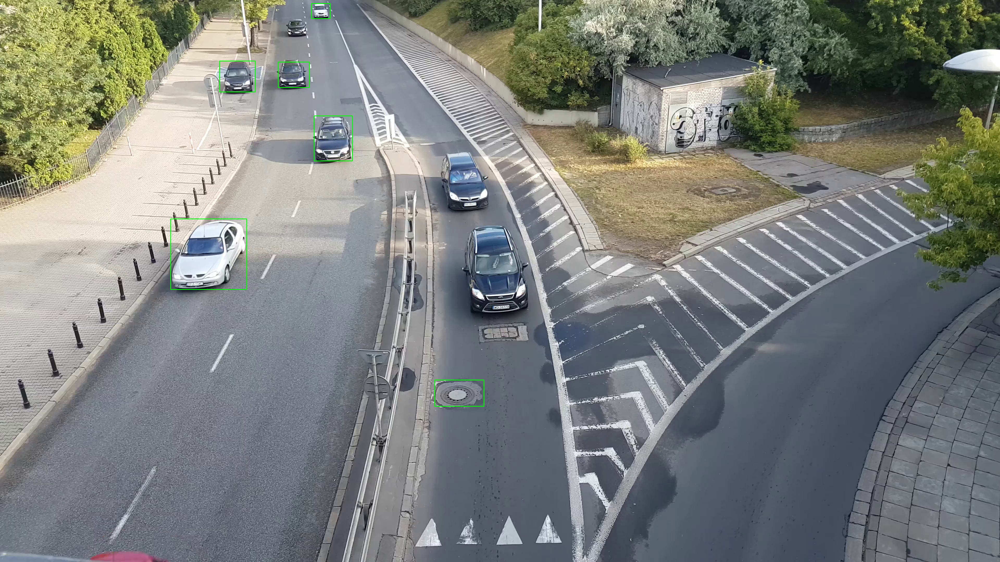

In [ ]:
cv2_imshow(frames[0])